In [1]:
# Project : Telecommunication Chrun

# Classification Project 

# Goal : training ,tuning & selecting best model to predict whether Customer is going to CHURN or stay

# EDA

In [2]:
# data ingestion : loading dataset

import pandas as pd

df = pd.read_excel('P585_Churn.xlsx')

df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [3]:
# checking dataset shape

df.shape

(5000, 21)

In [4]:
# dropping secondary index column : 'Unnamed: 0'

df.drop('Unnamed: 0',axis=1,inplace=True)

In [5]:
# basic information about dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area.code       5000 non-null   object 
 2   account.length  5000 non-null   int64  
 3   voice.plan      5000 non-null   object 
 4   voice.messages  5000 non-null   int64  
 5   intl.plan       5000 non-null   object 
 6   intl.mins       5000 non-null   float64
 7   intl.calls      5000 non-null   int64  
 8   intl.charge     5000 non-null   float64
 9   day.mins        5000 non-null   float64
 10  day.calls       5000 non-null   int64  
 11  day.charge      5000 non-null   object 
 12  eve.mins        5000 non-null   object 
 13  eve.calls       5000 non-null   int64  
 14  eve.charge      5000 non-null   float64
 15  night.mins      5000 non-null   float64
 16  night.calls     5000 non-null   int64  
 17  night.charge    5000 non-null   f

In [6]:
# stats description

df.describe()

,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [7]:
# cheching for dupicates

df.duplicated().sum()

0

In [8]:
# checking for missing values

df.isnull().sum()

state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [9]:
# handling miss categorized columns

df['day.charge'] = pd.to_numeric(df['day.charge'], errors='coerce').fillna(0)
df['eve.mins'] = pd.to_numeric(df['eve.mins'], errors='coerce').fillna(0)

In [10]:
# EDA on raw data

# segregating numerical & categorical columns

num_cols = df.select_dtypes(include=['int64','float64']).columns

cat_cols = df.select_dtypes(include='object').columns

print(f'numerical columns : {num_cols}\n')

print(f'categorical columns : {cat_cols}')

numerical columns : Index(['account.length', 'voice.messages', 'intl.mins', 'intl.calls',
       'intl.charge', 'day.mins', 'day.calls', 'day.charge', 'eve.mins',
       'eve.calls', 'eve.charge', 'night.mins', 'night.calls', 'night.charge',
       'customer.calls'],
      dtype='object')

categorical columns : Index(['state', 'area.code', 'voice.plan', 'intl.plan', 'churn'], dtype='object')


In [11]:
# ascerting number of outliers

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    outliers = df[col][(df[col] < lower) | (df[col] > upper)]
    print(f"number of Outliers in {col} : {len(outliers)}")

number of Outliers in account.length : 24
number of Outliers in voice.messages : 60
number of Outliers in intl.mins : 72
number of Outliers in intl.calls : 118
number of Outliers in intl.charge : 72
number of Outliers in day.mins : 34
number of Outliers in day.calls : 35
number of Outliers in day.charge : 41
number of Outliers in eve.mins : 64
number of Outliers in eve.calls : 27
number of Outliers in eve.charge : 42
number of Outliers in night.mins : 39
number of Outliers in night.calls : 43
number of Outliers in night.charge : 39
number of Outliers in customer.calls : 399


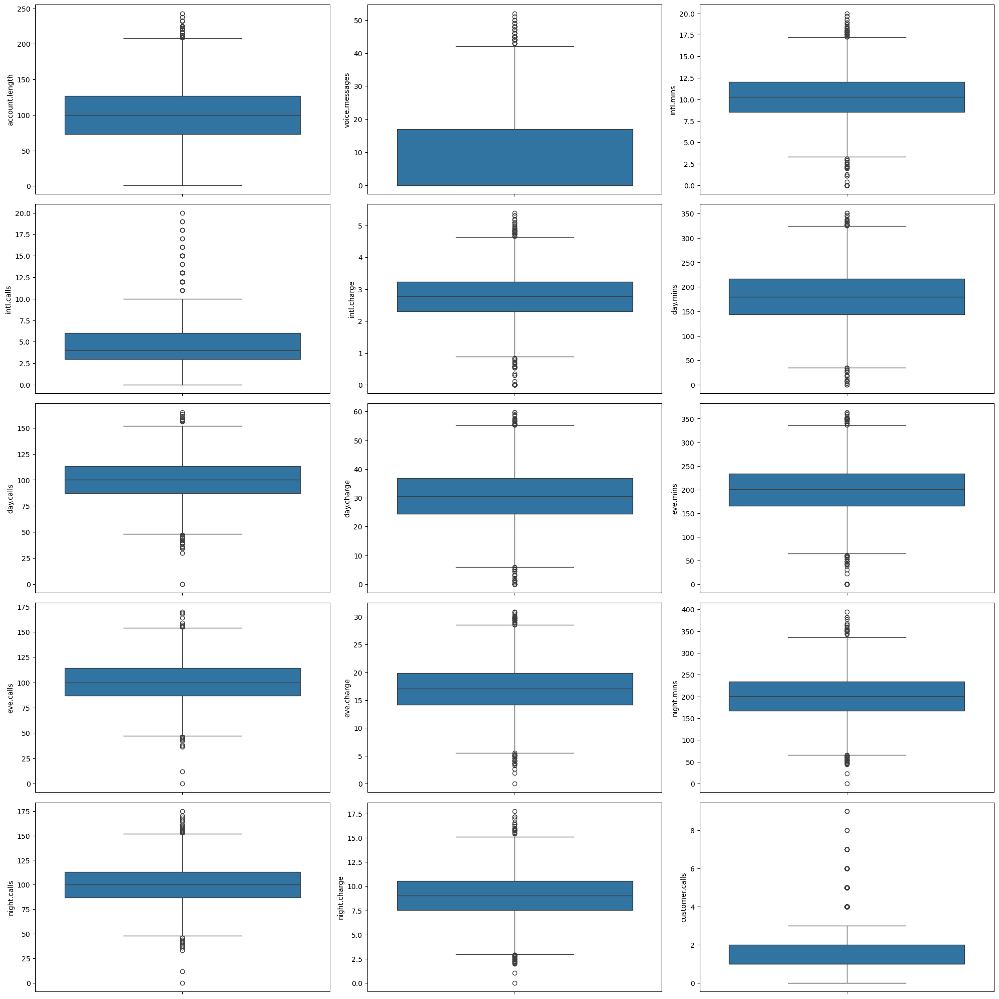

In [12]:
# visualizing outliers using boxplots

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20,20))
for i,col in enumerate(num_cols,1):
    plt.subplot(5,3,i)
    sns.boxplot(df[col])

plt.tight_layout()
plt.show()

Skewness of account.length: 0.11
Skewness of voice.messages: 1.35
Skewness of intl.mins: -0.21
Skewness of intl.calls: 1.36
Skewness of intl.charge: -0.21
Skewness of day.mins: -0.01
Skewness of day.calls: -0.08
Skewness of day.charge: -0.05
Skewness of eve.mins: -0.23
Skewness of eve.calls: -0.02
Skewness of eve.charge: -0.01
Skewness of night.mins: 0.02
Skewness of night.calls: 0.00
Skewness of night.charge: 0.02
Skewness of customer.calls: 1.04


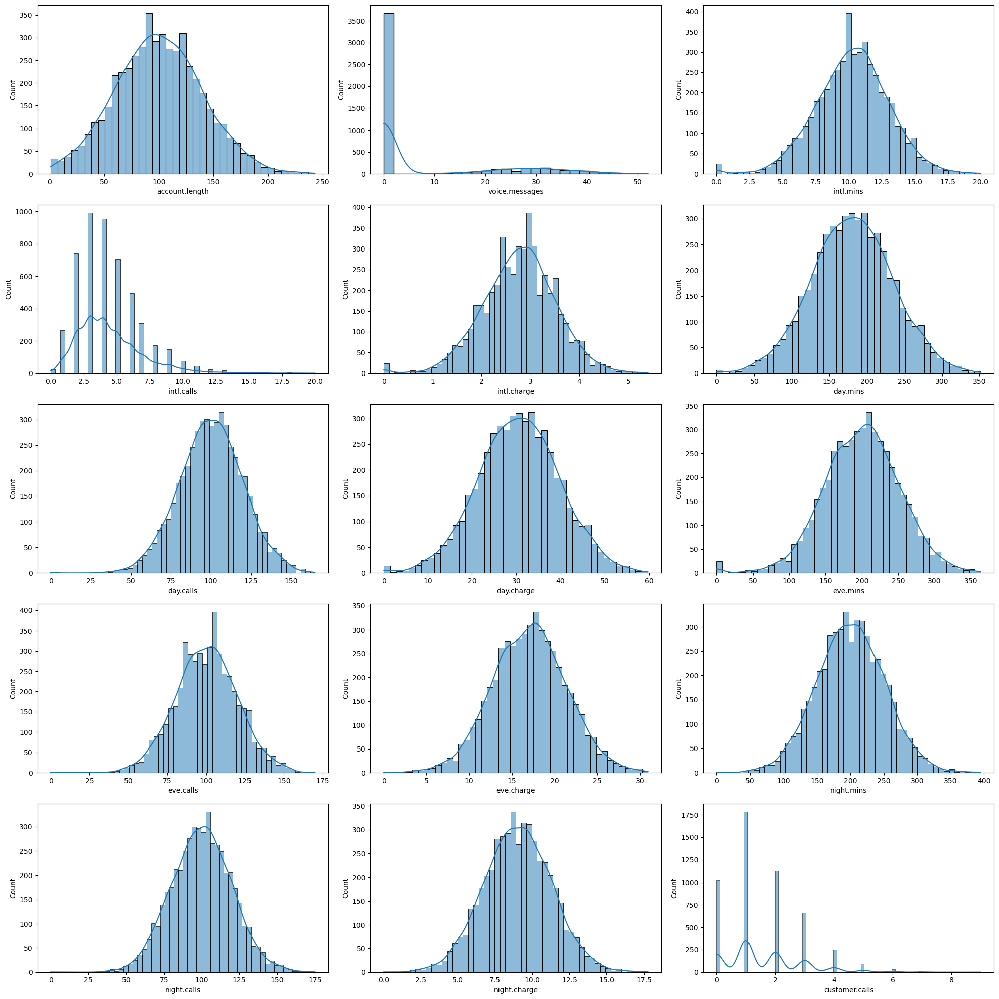

In [13]:
# checking for skewness & distribution

plt.figure(figsize=(20,20))

for i,col in enumerate(num_cols,1):
    plt.subplot(5,3,i)
    sns.histplot(df[col],kde=True)
    skewness = df[col].skew()
    print(f"Skewness of {col}: {skewness:.2f}")

plt.tight_layout()
plt.show()

In [14]:
# Feature Engg.

# merging 'mins' columns
df['total.mins'] = df['intl.mins']+df['day.mins']+df['eve.mins']+df['night.mins']

# international usage
df['intl_ratio'] = df['intl.mins'] / df['total.mins']

# call distribution
df['intl_ratio'] = df['intl.mins'] / df['total.mins']
df['day_ratio'] = df['day.mins'] / df['total.mins']
df['eve_ratio'] = df['eve.mins'] / df['total.mins']
df['night_ratio'] = df['night.mins'] / df['total.mins']

In [15]:
# charges per min
df['day.charge_per_min'] = df['day.charge'] / df['day.mins']
df['night.charge_per_min'] = df['night.charge'] / df['night.mins']
df['intl.charge_per_min'] = df['intl.charge'] / df['intl.mins']
df['eve.charge_per_min'] = df['eve.charge'] / df['eve.mins']

df['eve.charge_per_min'] = df['eve.charge_per_min'].replace([float('inf'), float('-inf')], 0)

In [16]:
# new numerical features list

new_num_cols = df.select_dtypes('number').columns

In [17]:
# ascerting number of outliers in new features

for col in new_num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    outliers = df[col][(df[col] < lower) | (df[col] > upper)]
    print(f"number of Outliers in {col} : {len(outliers)}")

number of Outliers in account.length : 24
number of Outliers in voice.messages : 60
number of Outliers in intl.mins : 72
number of Outliers in intl.calls : 118
number of Outliers in intl.charge : 72
number of Outliers in day.mins : 34
number of Outliers in day.calls : 35
number of Outliers in day.charge : 41
number of Outliers in eve.mins : 64
number of Outliers in eve.calls : 27
number of Outliers in eve.charge : 42
number of Outliers in night.mins : 39
number of Outliers in night.calls : 43
number of Outliers in night.charge : 39
number of Outliers in customer.calls : 399
number of Outliers in total.mins : 35
number of Outliers in intl_ratio : 115
number of Outliers in day_ratio : 56
number of Outliers in eve_ratio : 87
number of Outliers in night_ratio : 67
number of Outliers in day.charge_per_min : 69
number of Outliers in night.charge_per_min : 25
number of Outliers in intl.charge_per_min : 38
number of Outliers in eve.charge_per_min : 44


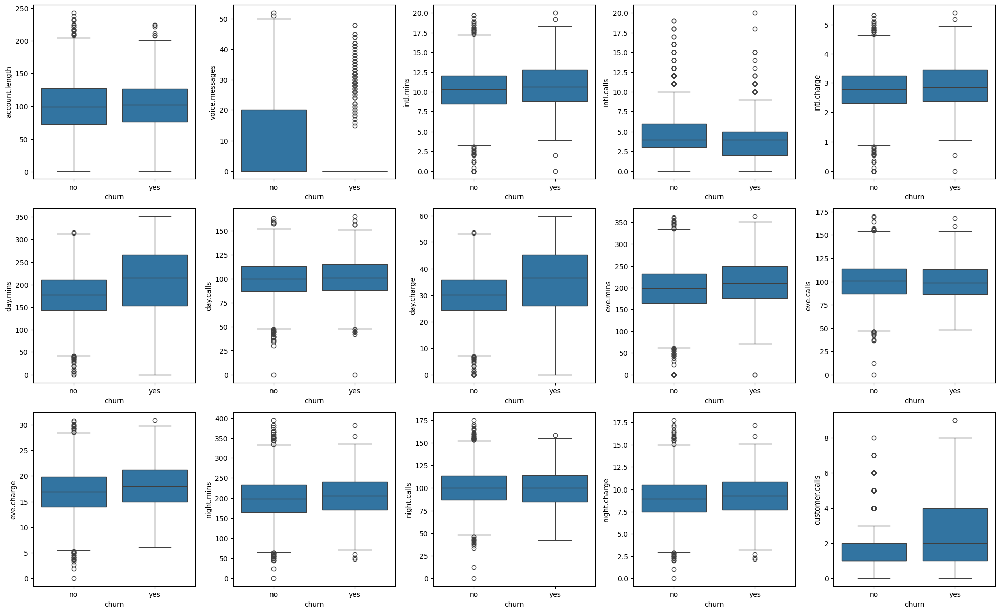

In [18]:
# univariate analysis : numerical features against target variable 'churn'
# box-plots

plt.figure(figsize=(20,20))
for i,col in enumerate(num_cols,1):
    plt.subplot(5,5,i)
    sns.boxplot(x=df['churn'],y=df[col])

plt.tight_layout()
plt.show()

In [19]:
# handling outliers using manual clipping

for col in new_num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[col] = df[col].clip(lower, upper)

In [20]:
# ascerting number of outliers : after clipping

for col in new_num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    outliers = df[col][(df[col] < lower) | (df[col] > upper)]
    print(f"number of Outliers in {col} : {len(outliers)}")

number of Outliers in account.length : 0
number of Outliers in voice.messages : 0
number of Outliers in intl.mins : 0
number of Outliers in intl.calls : 0
number of Outliers in intl.charge : 0
number of Outliers in day.mins : 0
number of Outliers in day.calls : 0
number of Outliers in day.charge : 0
number of Outliers in eve.mins : 0
number of Outliers in eve.calls : 0
number of Outliers in eve.charge : 0
number of Outliers in night.mins : 0
number of Outliers in night.calls : 0
number of Outliers in night.charge : 0
number of Outliers in customer.calls : 0
number of Outliers in total.mins : 0
number of Outliers in intl_ratio : 0
number of Outliers in day_ratio : 0
number of Outliers in eve_ratio : 0
number of Outliers in night_ratio : 0
number of Outliers in day.charge_per_min : 0
number of Outliers in night.charge_per_min : 0
number of Outliers in intl.charge_per_min : 0
number of Outliers in eve.charge_per_min : 0


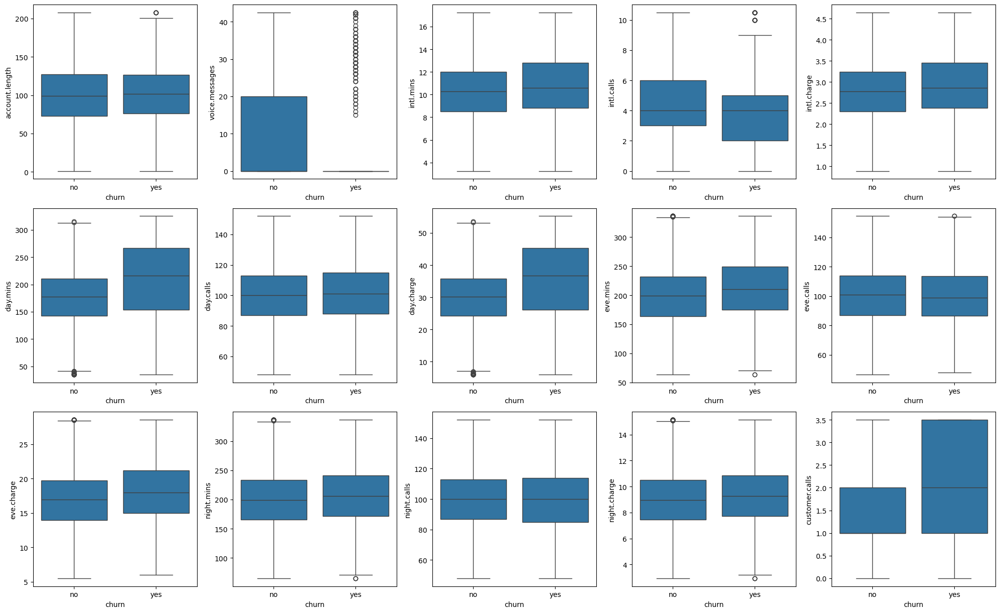

In [21]:
# box-plots : after clipping

plt.figure(figsize=(20,20))
for i,col in enumerate(num_cols,1):
    plt.subplot(5,5,i)
    sns.boxplot(x=df['churn'],y=df[col])

plt.tight_layout()
plt.show()

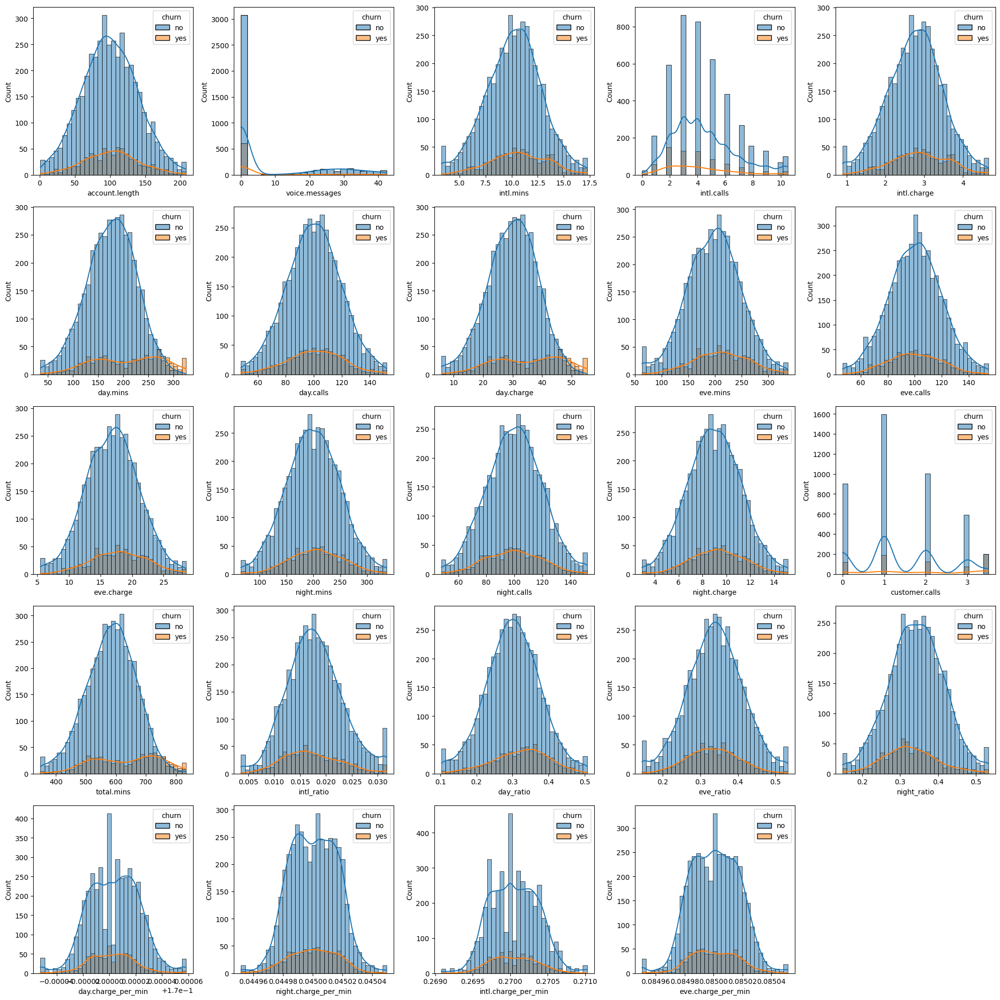

In [22]:
# histograms

plt.figure(figsize=(20,20))

for i,col in enumerate(new_num_cols,1):
    plt.subplot(5,5,i)
    sns.histplot(x=df[col], hue=df['churn'],kde=True)

plt.tight_layout()
plt.show()

In [23]:
# skew test

for col in new_num_cols:
    skewness = df[col].skew()
    print(f"Skewness of {col}: {skewness:.2f}")

Skewness of account.length: 0.07
Skewness of voice.messages: 1.33
Skewness of intl.mins: -0.08
Skewness of intl.calls: 0.79
Skewness of intl.charge: -0.07
Skewness of day.mins: 0.00
Skewness of day.calls: -0.03
Skewness of day.charge: -0.02
Skewness of eve.mins: -0.05
Skewness of eve.calls: 0.01
Skewness of eve.charge: 0.00
Skewness of night.mins: 0.01
Skewness of night.calls: 0.02
Skewness of night.charge: 0.01
Skewness of customer.calls: 0.32
Skewness of total.mins: -0.02
Skewness of intl_ratio: 0.24
Skewness of day_ratio: -0.05
Skewness of eve_ratio: -0.01
Skewness of night_ratio: 0.02
Skewness of day.charge_per_min: 0.02
Skewness of night.charge_per_min: -0.00
Skewness of intl.charge_per_min: 0.13
Skewness of eve.charge_per_min: -0.01


In [24]:
# applying 'log' transformation on right skewed features

import numpy as np

skewed_cols = ['voice.messages','intl.calls']

for col in skewed_cols:
    df[col] = np.log1p(df[col])

In [25]:
# skew test : after 'log' transformation

for col in new_num_cols:
    skewness = df[col].skew()
    print(f"Skewness of {col}: {skewness:.2f}")

Skewness of account.length: 0.07
Skewness of voice.messages: 1.10
Skewness of intl.mins: -0.08
Skewness of intl.calls: -0.31
Skewness of intl.charge: -0.07
Skewness of day.mins: 0.00
Skewness of day.calls: -0.03
Skewness of day.charge: -0.02
Skewness of eve.mins: -0.05
Skewness of eve.calls: 0.01
Skewness of eve.charge: 0.00
Skewness of night.mins: 0.01
Skewness of night.calls: 0.02
Skewness of night.charge: 0.01
Skewness of customer.calls: 0.32
Skewness of total.mins: -0.02
Skewness of intl_ratio: 0.24
Skewness of day_ratio: -0.05
Skewness of eve_ratio: -0.01
Skewness of night_ratio: 0.02
Skewness of day.charge_per_min: 0.02
Skewness of night.charge_per_min: -0.00
Skewness of intl.charge_per_min: 0.13
Skewness of eve.charge_per_min: -0.01


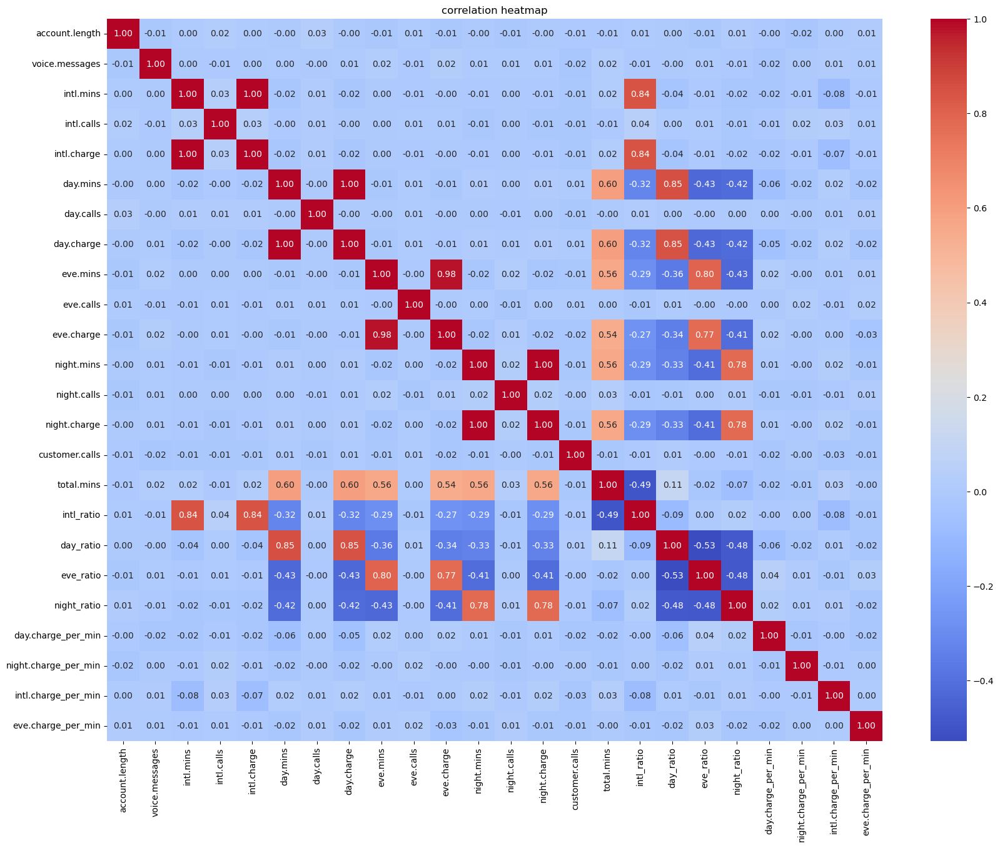

In [26]:
# checking correlation among features

corr = df[new_num_cols].corr()

plt.figure(figsize=(20,15))

sns.heatmap(corr,annot=True,cmap='coolwarm',fmt='.2f')

plt.title('correlation heatmap')
plt.show()

In [27]:
# dropping highly correlated features
# keeping ratios & dropping 'mins' & 'charges'

feats_to_drop = ['intl.charge','day.charge','eve.charge','night.charge','intl.mins','day.mins','eve.mins','night.mins']

df.drop(feats_to_drop,axis=1,inplace=True)

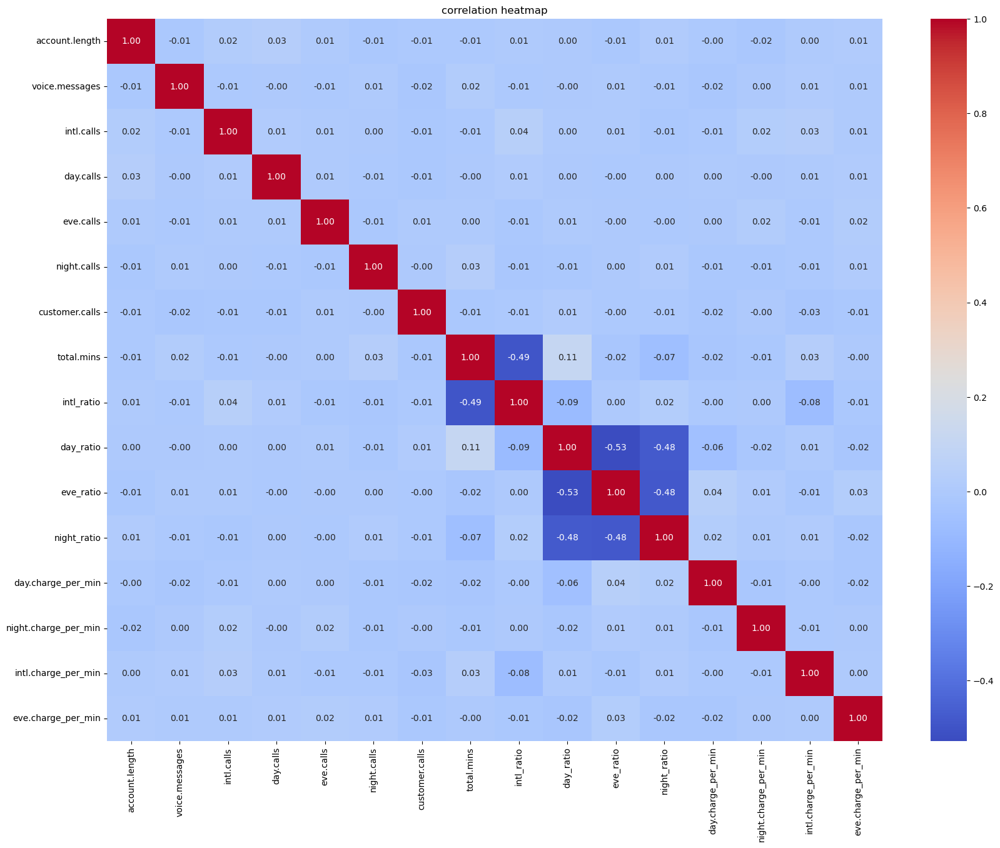

In [28]:
# checking correlation on updated df

new_num_cols = df.select_dtypes('number').columns

corr = df[new_num_cols].corr()

plt.figure(figsize=(20,15))

sns.heatmap(corr,annot=True,cmap='coolwarm',fmt='.2f')

plt.title('correlation heatmap')
plt.show()

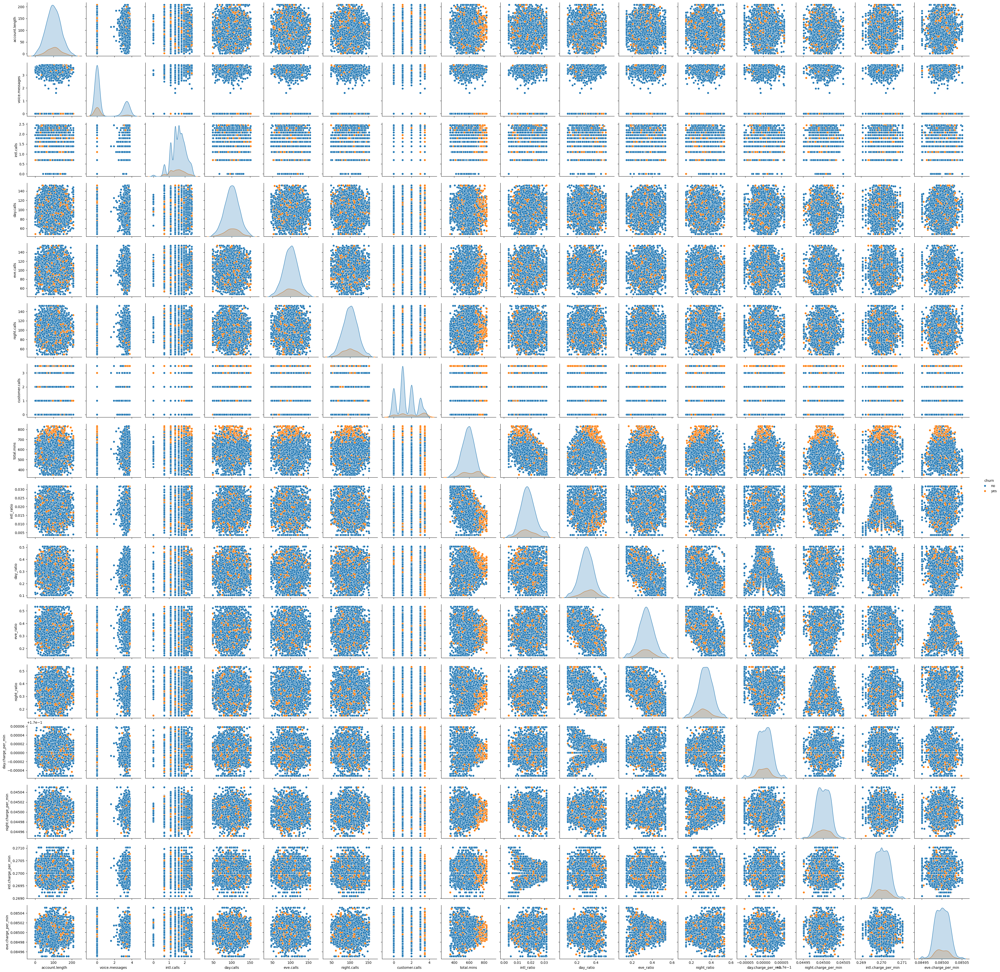

In [29]:
# plotting pair plots

sns.pairplot(df,hue='churn')
plt.show()

In [30]:
# chi-square test of independence 
# checks whether there is a significant association between categorical variables & target

from scipy.stats import chi2_contingency

# creating contingency table
for col in cat_cols:
    print(f'{col} vs target')
    table = pd.crosstab(df[col], df['churn'])
    
# chi-square test
    result = chi2_contingency(table)

# running hypothesis test 
# result[1] == p-value
    if result[1] < 0.05:
        print("reject Ho : significant relationship exists")
    else:
        print("failed to reject Ho : no evidence of association")
    print("-"*20)

state vs target
reject Ho : significant relationship exists
--------------------
area.code vs target
failed to reject Ho : no evidence of association
--------------------
voice.plan vs target
reject Ho : significant relationship exists
--------------------
intl.plan vs target
reject Ho : significant relationship exists
--------------------
churn vs target
reject Ho : significant relationship exists
--------------------


In [31]:
# categorical features stats

for col in cat_cols:
    print(f'{col} :{df[col].value_counts()}')

state :state
WV    158
MN    125
AL    124
ID    119
VA    118
OH    116
TX    116
WY    115
NY    114
OR    114
NJ    112
UT    112
WI    106
MI    103
ME    103
MA    103
MD    102
VT    101
MT     99
RI     99
KY     99
MS     99
CT     99
KS     99
WA     98
IN     98
CO     96
NH     95
DE     94
MO     93
AR     92
NM     91
NC     91
SC     91
FL     90
NV     90
OK     90
TN     89
AZ     89
DC     88
IL     88
NE     88
ND     88
HI     86
SD     85
GA     83
LA     82
PA     77
AK     72
IA     69
CA     52
Name: count, dtype: int64
area.code :area.code
area_code_415    2495
area_code_408    1259
area_code_510    1246
Name: count, dtype: int64
voice.plan :voice.plan
no     3677
yes    1323
Name: count, dtype: int64
intl.plan :intl.plan
no     4527
yes     473
Name: count, dtype: int64
churn :churn
no     4293
yes     707
Name: count, dtype: int64


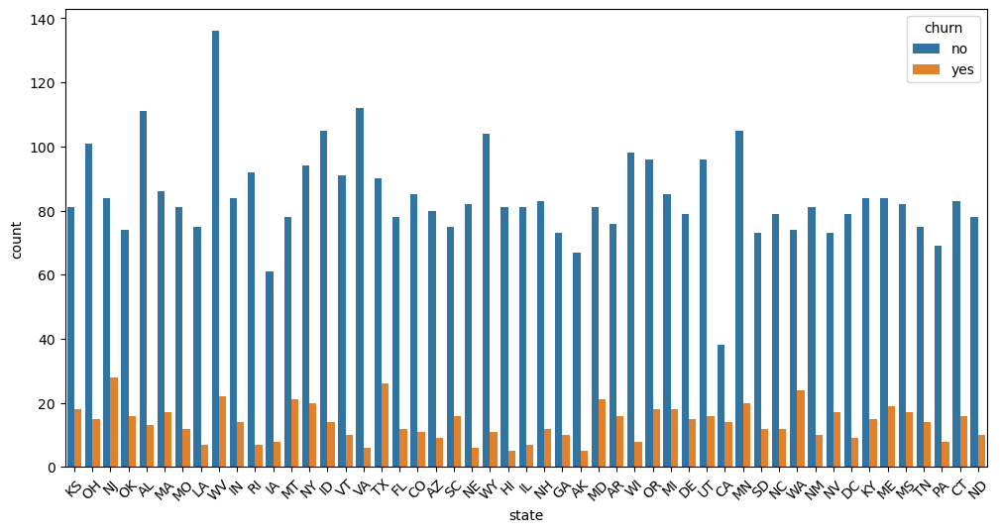

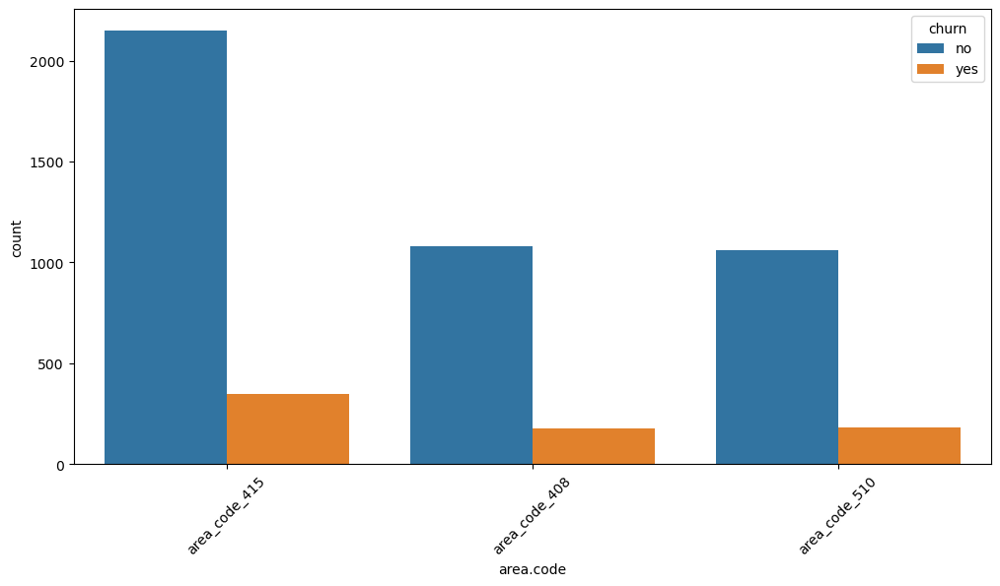

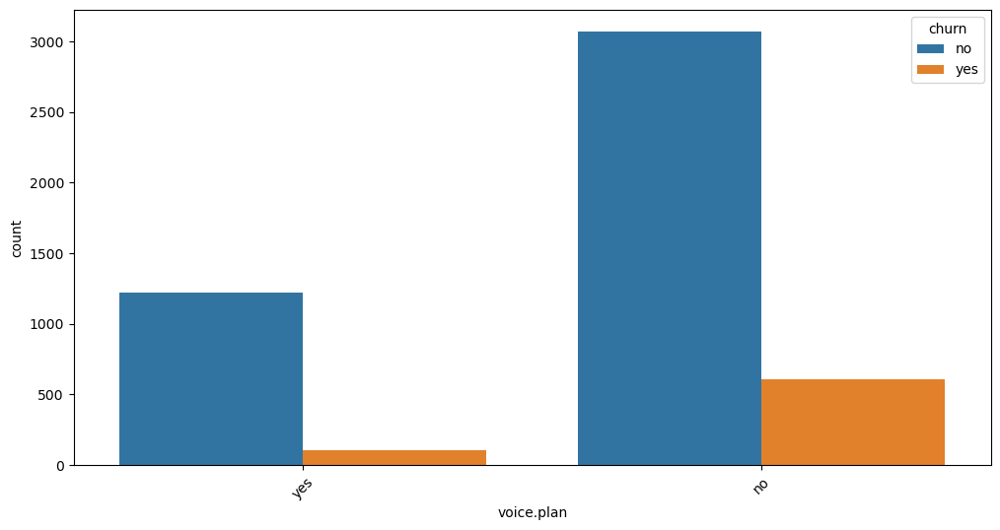

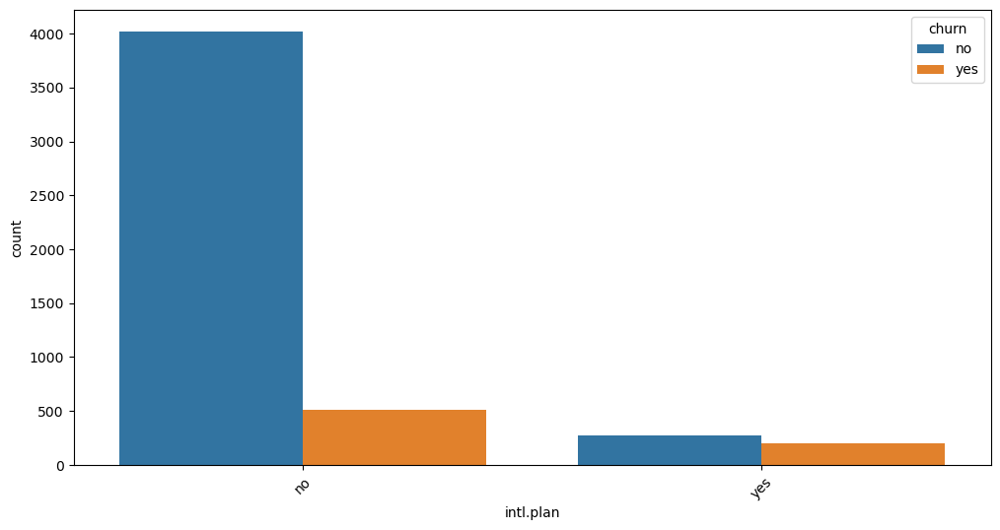

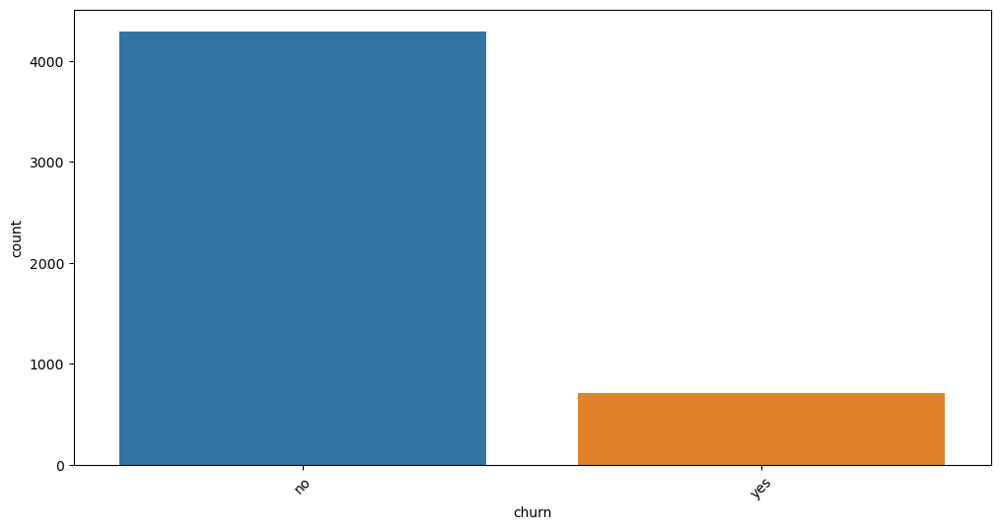

In [32]:
# categorical features against 'churn'
for col in cat_cols:
    plt.figure(figsize=(12,6))
    sns.countplot(x=df[col], hue=df['churn'], data=df)
    plt.xticks(rotation=45)

plt.show()

In [33]:
# dropping missing values from final 'df' (if any)
df.dropna(inplace=True)

In [34]:
# seperating independent & target variables

X = df.drop(['churn'],axis=1)
y = df['churn']

In [35]:
# encoding target variable 'churn'

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

y = le.fit_transform(y)

In [36]:
# train-test split
# train set size 80% & test set size 20%
# 'stratify=y' for making train & test datasets balanced

from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=38,stratify=y)

In [37]:
# encoding categorical features
# frequency encoding 'state' column

state_freq = X_train['state'].value_counts(normalize=True)

# mapping the frequencies to both train and test sets
X_train['state_freq'] = X_train['state'].map(state_freq)
X_test['state_freq'] = X_test['state'].map(state_freq)

# dropping the original 'state' column
X_train = X_train.drop('state', axis=1)
X_test = X_test.drop('state', axis=1)

* Frequency Encoding because it has too many unique values , choosing OneHotEncoder gives 51 NEW COLUMNS risk of overfitting, choosing OrdinalEncoder give FALSE weightage to values

- (normalize=True) : FREQUENCY ENCODING (scaled)
- Returns the proportion (or percentage, as a float between 0 and 1) of the total dataset that belongs to each state (e.g.,WV:0.031) </br>
  
- (normalize=False) (Default) : COUNT ENCODING (RAW numbers)	
- Returns the raw count of how many times each state appears (e.g., WV: 158)

In [50]:
# later to be used in streamlit_app.py

print(state_freq.to_dict())

{'WV': 0.032185064118682424, 'MN': 0.024893135529293436, 'TX': 0.024641689715866232, 'VA': 0.024641689715866232, 'AL': 0.024641689715866232, 'OR': 0.02388735227558461, 'NY': 0.02388735227558461, 'OH': 0.023133014835302994, 'UT': 0.022881569021875787, 'NJ': 0.022881569021875787, 'ID': 0.022378677395021373, 'WY': 0.02187578576816696, 'WA': 0.02137289414131255, 'MD': 0.02137289414131255, 'MA': 0.02137289414131255, 'ME': 0.020870002514458134, 'KY': 0.020870002514458134, 'WI': 0.020870002514458134, 'CT': 0.020618556701030927, 'MT': 0.02036711088760372, 'MO': 0.02036711088760372, 'MI': 0.020115665074176513, 'RI': 0.01986421926074931, 'VT': 0.019612773447322103, 'NM': 0.019361327633894896, 'NC': 0.018858436007040482, 'CO': 0.018606990193613275, 'TN': 0.018606990193613275, 'MS': 0.018606990193613275, 'KS': 0.01835554438018607, 'IN': 0.01835554438018607, 'FL': 0.018104098566758865, 'NH': 0.017852652753331658, 'NE': 0.017852652753331658, 'OK': 0.017852652753331658, 'GA': 0.017349761126477244, 'A

In [38]:
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer

oe = ['area.code','voice.plan','intl.plan']

scale = ['account.length', 'intl.calls','day.calls', 'eve.calls', 'night.calls',
        'total.mins', 'intl_ratio', 'day_ratio', 'eve_ratio',
        'night_ratio', 'day.charge_per_min','eve.charge_per_min',
        'night.charge_per_min', 'intl.charge_per_min','customer.calls']

robust = ['voice.messages']

# column transformer
transformer = ColumnTransformer([
    ('oe', OrdinalEncoder() , oe),
    ('std_scaler', StandardScaler(), scale),
    ('robust', RobustScaler(), robust),
], remainder='passthrough')

* Robust Scaling 'voice.messages' to minimize outliers effect 
- because even after 'log' transforming it has go outliers (still right skewed : 1.10)

In [39]:
# transforming training & test sets

transformer.fit(X_train)

X_train_t = transformer.transform(X_train)
X_test_t = transformer.transform(X_test)

In [40]:
# saving 'transformer' as pickel file

import joblib 

with open('transformer.pkl','wb') as f:
    joblib.dump(transformer,f)

In [41]:
# saving the DataFrames as .csv files

feature_names = transformer.get_feature_names_out()

# converting transformed X_train & X_test set back to DataFrames
X_train_df = pd.DataFrame(X_train_t, columns=feature_names)
X_test_df = pd.DataFrame(X_test_t, columns=feature_names)

X_train_df.to_csv('X_train_transformed.csv', index=False)
X_test_df.to_csv('X_test_transformed.csv', index=False)

In [42]:
# converting y_train & y_test to .csv files

y_train_series = pd.Series(y_train, name='target_churn')
y_test_series = pd.Series(y_test, name='target_churn')

y_train_series.to_csv('y_train_transformed.csv', index=False)
y_test_series.to_csv('y_test_transformed.csv', index=False)

In [43]:
# applying SMOTE to handle imbalance dataset

from imblearn.over_sampling import SMOTE

print("Before SMOTE:", pd.Series(y_train).value_counts())

smote = SMOTE(random_state=38)

X_train_res, y_train_res = smote.fit_resample(X_train_t, y_train)

print("After SMOTE:", pd.Series(y_train_res).value_counts())

Before SMOTE: 0    3413
1     564
Name: count, dtype: int64
After SMOTE: 1    3413
0    3413
Name: count, dtype: int64
